# Lagrangian Neural Network
[Paper](https://arxiv.org/abs/2003.04630)
[Blog](https://greydanus.github.io/2020/03/10/lagrangian-nns/)
by Cranmer et. al

## What is Lagrangian Mechanics?

Newtonian mechanics describes motion using forces and accelerations, following $F = ma$. While effective, this approach can become cumbersome for complex systems.  

Lagrangian mechanics reformulates dynamics using the **principle of least action**. Instead of forces, it relies on the **Lagrangian**, $L = T - V$, where $T$ is kinetic energy and $V$ is potential energy. The equations of motion emerge from the **Euler-Lagrange equation**:  

$$
\frac{d}{dt} \left( \frac{\partial L}{\partial \dot{q}} \right) - \frac{\partial L}{\partial q} = 0
$$



In this notebook, we will try to create a neural network that takes tries to incorporate this equation to model the dynamics of a double pendulum. The code in the notebook is adapted from the original code published by the authors of the paper with minor tweaks for better explainability.

In [2]:
#if running on a mac, please uncomment run this cell first

# import os
# os.environ['JAX_PLATFORM_NAME'] = 'cpu'

We will have to do so in jax. Some of the functions implemented here are a bit too slow to do in pytorch. Jax works like a charm :)

In [4]:
import jax
import xarray
import jax.numpy as jnp
import numpy as np
from jax.experimental.ode import odeint
import matplotlib.pyplot as plt
from functools import partial

from jax.example_libraries import stax
from jax.example_libraries import optimizers

import matplotlib.pyplot as plt
from matplotlib.patches import Circle

from functools import partial
import pickle
from tqdm.notebook import tqdm_notebook as tqdm


In [5]:
# check if we are using cpu or gpu.
# Unfortunately we get some compatibility issues with mps devices
# so on mac, we still need to use cpu :(
from jax.lib import xla_bridge
print(xla_bridge.get_backend().platform)

/var/folders/qn/xqf2q5g92lgd4j6z0bq50vyh0000gp/T/ipykernel_47836/2479261326.py:5: DeprecationWarning: jax.lib.xla_bridge.get_backend is deprecated; use jax.extend.backend.get_backend.
  print(xla_bridge.get_backend().platform)


Metal device set to: Apple M2

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

cpu


W0000 00:00:1740073212.123211 38007684 mps_client.cc:510] WARNING: JAX Apple GPU support is experimental and not all JAX functionality is correctly supported!
I0000 00:00:1740073212.138860 38007684 service.cc:145] XLA service 0x1168070c0 initialized for platform METAL (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1740073212.138887 38007684 service.cc:153]   StreamExecutor device (0): Metal, <undefined>
I0000 00:00:1740073212.141683 38007684 mps_client.cc:406] Using Simple allocator.
I0000 00:00:1740073212.141721 38007684 mps_client.cc:384] XLA backend will use up to 11452858368 bytes on device 0 for SimpleAllocator.


## Modelling a double pendulum


The lagrangian of a double pendulum is given by:
$$
\begin{align}
L = & \frac{1}{2}(m_1 + m_2) l_1^2 \dot{\theta}_1^2 +
	\frac{1}{2}m_2 l_2^2 \dot{\theta}_2^2 + m_2l_1l_2\dot{\theta}_1\dot{\theta}_2
	\cos(\theta_1 - \theta_2)\nonumber\\[3pt]
     &+ (m_1 + m_2) g l_1 \cos\theta_1 + m_2 g l_2\cos\theta_2
\end{align}
$$


<img src="https://raw.githubusercontent.com/greydanus/greydanus.github.io/master/files/double_pend_schema.png">


Even though the system is chaotic, we can still solve it analytically! To do so, we need to do some algebraic manupulations: (see [here](https://dassencio.org/33) for more details and explicit derivations)

\begin{align}
& \alpha_1(\theta_1,\theta_2) ~:=~ \displaystyle\frac{l_2}{l_1}\left(\frac{m_2}{m_1 + m_2}\right)\cos(\theta_1 - \theta_2)\\
&\alpha_2(\theta_1,\theta_2) ~:=~ \frac{l_1}{l_2}\cos(\theta_1-\theta_2)\\
&\displaystyle f_1(\theta_1, \theta_2, \dot{\theta}_1, \dot{\theta}_2) ~:=~
-\frac{l_2}{l_1}\left(\frac{m_2}{m_1+m_2}\right) \dot{\theta}_2^2\sin(\theta_1 - \theta_2)
- \frac{g}{l_1} \sin\theta_1 \\
&\displaystyle f_2(\theta_1, \theta_2, \dot{\theta}_1, \dot{\theta}_2) ~:=~
\frac{l_1}{l_2}\dot{\theta}_1^2\sin(\theta_1-\theta_2) - \frac{g}{l_2} \sin\theta_2 \\
&g_1 := \displaystyle\frac{f_1 - \alpha_1 f_2}{1 - \alpha_1\alpha_2}
\quad\quad
g_2 := \displaystyle\frac{-\alpha_2 f_1 + f_2}{1 - \alpha_1\alpha_2}
\end{align}

With this, we can express the analytical dynamics of the system in matrix form:

$$
\displaystyle\frac{d}{dt}
\left( \begin{matrix} \theta_1 \\[1pt] \theta_2 \\[1pt] \omega_1 \\[1pt] \omega_1 \end{matrix} \right)
=
\left( \begin{matrix} \omega_1 \\ \omega_2 \\ g_1(\theta_1,\theta_2,\omega_1,\omega_2)
\\ g_2(\theta_1,\theta_2,\omega_1,\omega_2) \end{matrix} \right)
$$

Let's define these two functions

In [6]:
def lagrangian(q, q_dot, m1, m2, l1, l2, g):
  t1, t2 = q     # theta 1 and theta 2
  w1, w2 = q_dot # omega 1 and omega 2

  # kinetic energy (T)
  T1 = 0.5 * m1 * (l1 * w1)**2
  T2 = 0.5 * m2 * ((l1 * w1)**2 + (l2 * w2)**2 +
                    2 * l1 * l2 * w1 * w2 * jnp.cos(t1 - t2))
  T = T1 + T2

  # potential energy (V)
  y1 = -l1 * jnp.cos(t1)
  y2 = y1 - l2 * jnp.cos(t2)
  V = m1 * g * y1 + m2 * g * y2

  return T - V

In [7]:
def f_analytical(state, t=0, m1=1, m2=1, l1=1, l2=1, g=9.8):
  t1, t2, w1, w2 = state
  a1 = (l2 / l1) * (m2 / (m1 + m2)) * jnp.cos(t1 - t2)
  a2 = (l1 / l2) * jnp.cos(t1 - t2)
  f1 = -(l2 / l1) * (m2 / (m1 + m2)) * (w2**2) * jnp.sin(t1 - t2) - \
      (g / l1) * jnp.sin(t1)
  f2 = (l1 / l2) * (w1**2) * jnp.sin(t1 - t2) - (g / l2) * jnp.sin(t2)
  g1 = (f1 - a1 * f2) / (1 - a1 * a2)
  g2 = (f2 - a2 * f1) / (1 - a1 * a2)
  return jnp.stack([w1, w2, g1, g2])

# Use Lagrangain to obtain the dynamics
This step is, in fact, the most essential part of the process!


How physicists solve it: Applying the Euler-Lagrange relationship -> compute a set of analytical equations of motion -> solve!
But we want to use neural network to learn the dynamics! A simple idea would be that we could pass the current position ($q$) and velocity ($\dot q$) at current timestamp through Feed forward network and train to predict the acceleration. But doing so will not ensure that the system actually learns the dynamics.  Instead, tha athors propose an intermediate output, the Lagrangian which can be used to derive the dynamics of the system

![LNN](./LNN.png)

one could obtain the dynamics through numerical integration with clever manupulations
$$
\begin{align}
\frac{d}{dt} \frac{\partial {L}}{\partial \dot q_j} &= \frac{\partial {L}}{\partial q_j} & \text{write down the Euler-Lagrange equation} \quad (1)\\
\frac{d}{dt} \nabla_{\dot q} {L} &= \nabla_{q} {L} & \text{switch to vector notation} \quad (2)\\
(\nabla_{\dot q}\nabla_{\dot q}^{\top}{L})\ddot q + (\nabla_{q}\nabla_{\dot q}^{\top}{L}) \dot q &= \nabla_q {L} & \text{expand the time derivative }\frac{d}{dt} \quad (3)\\
\ddot q &= (\nabla_{\dot q}\nabla_{\dot q}^{\top}{L})^{-1}[\nabla_q {L} - (\nabla_{q}\nabla_{\dot q}^{\top}{L})\dot q] & \text{use a matrix inverse to solve for } \ddot q \quad (4)\\
\end{align}
$$

We need both Hessian and the gradient during the forward pass!. Unfortunately this operstion isn't as fast in pytorch. Thus, we have to keep the whole codebase in jax :(

In [8]:
def equation_of_motion(lagrangian, state, t=None):
  q, q_t = jnp.split(state, 2)
  q_tt = (jnp.linalg.pinv(jax.hessian(lagrangian, 1)(q, q_t))
          @ (jax.grad(lagrangian, 0)(q, q_t)
             - jax.jacobian(jax.jacobian(lagrangian, 1), 0)(q, q_t) @ q_t))
  return jnp.concatenate([q_t, q_tt])

#integrate the equation of motion
def solve_lagrangian(lagrangian, initial_state, **kwargs):
  # We currently run odeint on CPUs only, because its cost is dominated by
  # control flow, which is slow on GPUs.
  @partial(jax.jit, backend='cpu')
  def f(initial_state):
    return odeint(partial(equation_of_motion, lagrangian),
                  initial_state, **kwargs)
  return f(initial_state)

In [9]:

# Double pendulum dynamics via analytical forces
@partial(jax.jit, backend='cpu')
def solve_analytical(initial_state, times):
  return odeint(f_analytical, initial_state, t=times, rtol=1e-10, atol=1e-10)

# Double pendulum dynamics via the rewritten Euler-Lagrange
@partial(jax.jit, backend='cpu')
def solve_autograd(initial_state, times, m1=1, m2=1, l1=1, l2=1, g=9.8):
  L = partial(lagrangian, m1=m1, m2=m2, l1=l1, l2=l2, g=g)
  return solve_lagrangian(L, initial_state, t=times, rtol=1e-10, atol=1e-10)


def normalize_dp(state):
  # wrap generalized coordinates to [-pi, pi]
  return jnp.concatenate([(state[:2] + np.pi) % (2 * np.pi) - np.pi, state[2:]])

def rk4_step(f, x, t, h):
  # one step of runge-kutta integration
  k1 = h * f(x, t)
  k2 = h * f(x + k1/2, t + h/2)
  k3 = h * f(x + k2/2, t + h/2)
  k4 = h * f(x + k3, t + h)
  return x + 1/6 * (k1 + 2 * k2 + 2 * k3 + k4)

### Let's verify if all of this makes sense


In [10]:
# a random initial state
# state = [theta_1, theta_2, omega_1, omega_2]
x0 = np.array([3*np.pi/7, 3*np.pi/4, 0, 0], dtype=np.float32)
noise = np.random.RandomState(0).randn(x0.size)
t = np.linspace(0, 40, num=401, dtype=np.float32)

In [15]:
x_analytical = jax.device_get(solve_analytical(x0, t))
noise_coeff_1, noise_coeff_2 = 1e-9, 1e-11
x_perturbed_1 = jax.device_get(solve_analytical(x0 + noise_coeff_1 * noise, t))
x_perturbed_2 = jax.device_get(solve_analytical(x0 + noise_coeff_2 * noise, t))

In [16]:
x_autograd = jax.device_get(solve_autograd(x0, t))

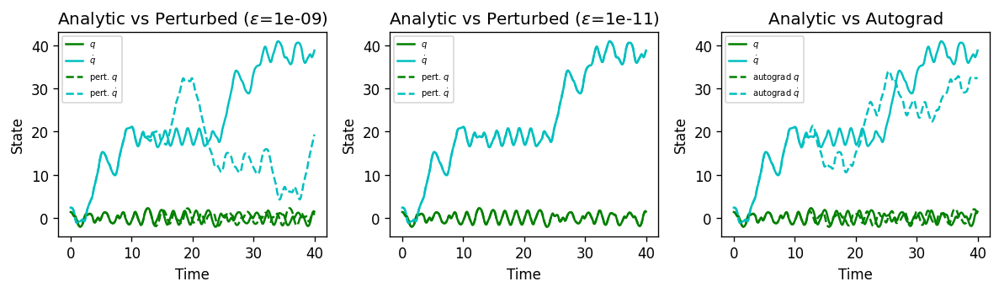

In [17]:
plt.figure(figsize=[10,3], dpi=120)
plt.subplot(1,3,1)
plt.title(r"Analytic vs Perturbed ($\epsilon$={})".format(noise_coeff_1))
plt.xlabel("Time") ; plt.ylabel("State")
plt.plot(t, x_analytical[:, 0], 'g-', label=r'$q$')
plt.plot(t, x_analytical[:, 1], 'c-', label=r'$\dot q$')
plt.plot(t, x_perturbed_1[:, 0], 'g--', label=r'pert. $q$')
plt.plot(t, x_perturbed_1[:, 1], 'c--', label=r'pert. $\dot q$')
plt.legend(fontsize=6)

plt.subplot(1,3,2)
plt.title(r"Analytic vs Perturbed ($\epsilon$={})".format(noise_coeff_2))
plt.xlabel("Time") ; plt.ylabel("State")
plt.plot(t, x_analytical[:, 0], 'g-', label=r'$q$')
plt.plot(t, x_analytical[:, 1], 'c-', label=r'$\dot q$')
plt.plot(t, x_perturbed_2[:, 0], 'g--', label=r'pert. $q$')
plt.plot(t, x_perturbed_2[:, 1], 'c--', label=r'pert. $\dot q$')
plt.legend(fontsize=6)

plt.subplot(1,3,3)
plt.title("Analytic vs Autograd")
plt.xlabel("Time") ; plt.ylabel("State")
plt.plot(t, x_analytical[:, 0], 'g-', label=r'$q$')
plt.plot(t, x_analytical[:, 1], 'c-', label=r'$\dot q$')
plt.plot(t, x_autograd[:, 0], 'g--', label=r'autograd $q$')
plt.plot(t, x_autograd[:, 1], 'c--', label=r'autograd $\dot q$')
plt.legend(fontsize=6)

plt.tight_layout()
plt.show()

The autograd seems to be doing something reasonable!
Now we can start with the ML part!

# Training Data

In [18]:
time_step = 0.01
N = 1500 # number of timesteps
analytical_step = jax.jit(jax.vmap(partial(rk4_step, f_analytical, t=0.0, h=time_step)))

x0 = np.array([3*np.pi/7, 3*np.pi/4, 0, 0], dtype=np.float32)
t = np.arange(N, dtype=np.float32) # time steps 0 to N
x_train = jax.device_get(solve_analytical(x0, t)) # dynamics for first N time steps
xt_train = jax.device_get(jax.vmap(f_analytical)(x_train)) # time derivatives of each state
y_train = jax.device_get(analytical_step(x_train)) # analytical next step

noise = np.random.RandomState(0).randn(x0.size)
t_test = np.arange(N, 2*N, dtype=np.float32) # time steps N to 2N
x_test = jax.device_get(solve_analytical(x0, t_test)) # dynamics for next N time steps
xt_test = jax.device_get(jax.vmap(f_analytical)(x_test)) # time derivatives of each state
y_test = jax.device_get(analytical_step(x_test)) # analytical next step

In [19]:
#Let's see what the data looks like
print(x_train.shape, xt_train.shape, y_train.shape)
print(x_test.shape, xt_test.shape, y_test.shape)
print('x_train:', x_train[5])
print('xt_train:', xt_train[5])
print('y_train:', y_train[5])


(1500, 4) (1500, 4) (1500, 4)
(1500, 4) (1500, 4) (1500, 4)
x_train: [-0.0960218 14.6896715  4.1300464  4.939565 ]
xt_train: [  4.1300464   4.939565    4.9383783 -18.95327  ]
y_train: [-0.0544998 14.738105   4.1718407  4.7457685]


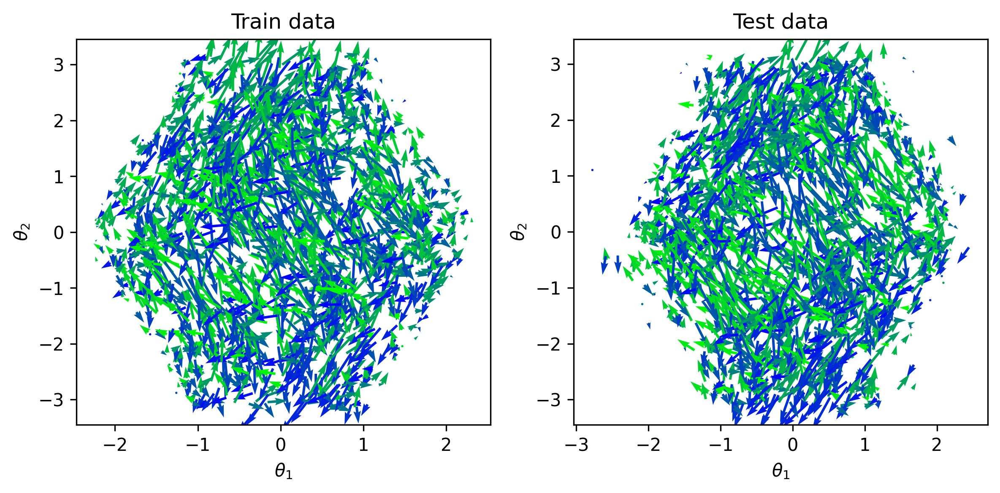

In [20]:
# visualise train and data
train_vis = jax.vmap(normalize_dp)(x_train)
test_vis = jax.vmap(normalize_dp)(x_test)

vel_angle = lambda data:  (np.arctan2(data[:,3], data[:,2]) / np.pi + 1)/2
vel_color = lambda vangle: np.stack( [np.zeros_like(vangle), vangle, 1-vangle]).T
train_colors = vel_color(vel_angle(train_vis))
test_colors = vel_color(vel_angle(test_vis))

SCALE = 80 ; WIDTH = 0.006
plt.figure(figsize=[8,4], dpi=300)
plt.subplot(1,2,1)
plt.title("Train data") ; plt.xlabel(r'$\theta_1$') ; plt.ylabel(r'$\theta_2$')
plt.quiver(*train_vis.T, color=train_colors, scale=SCALE, width=WIDTH)

plt.subplot(1,2,2)
plt.title("Test data") ; plt.xlabel(r'$\theta_1$') ; plt.ylabel(r'$\theta_2$')
plt.quiver(*test_vis.T, color=test_colors, scale=SCALE, width=WIDTH)

plt.tight_layout() ; plt.show()

# The Neural Network
Replace the Lagrangian with a parametric model. Here the function learned_lagrangian is a function of learnable params and returns the Lagrangian function defined inside it as a neural network.

In [21]:
# replace the lagrangian with a parameteric model
def learned_lagrangian(params):
  def lagrangian(q, q_t):
    assert q.shape == (2,)
    state = normalize_dp(jnp.concatenate([q, q_t]))
    return jnp.squeeze(nn_forward_fn(params, state), axis=-1)
  return lagrangian

# build a neural network model
init_random_params, nn_forward_fn = stax.serial(
    stax.Dense(128),
    stax.Softplus,
    stax.Dense(128),
    stax.Softplus,
    stax.Dense(1),
)

In [22]:
# define the loss of the model (MSE between predicted q, \dot q and targets)
@jax.jit
def loss(params, batch, time_step=None):
  state, targets = batch
  if time_step is not None:
    f = partial(equation_of_motion, learned_lagrangian(params))
    preds = jax.vmap(partial(rk4_step, f, t=0.0, h=time_step))(state)
  else:
    preds = jax.vmap(partial(equation_of_motion, learned_lagrangian(params)))(state)
  return jnp.mean((preds - targets) ** 2)

@jax.jit
def update_timestep(i, opt_state, batch):
  params = get_params(opt_state)
  return opt_update(i, jax.grad(loss)(params, batch, time_step), opt_state)

@jax.jit
def update_derivative(i, opt_state, batch):
  params = get_params(opt_state)
  return opt_update(i, jax.grad(loss)(params, batch, None), opt_state)


In [23]:
x_train = jax.device_put(jax.vmap(normalize_dp)(x_train))
y_train = jax.device_put(y_train)

x_test = jax.device_put(jax.vmap(normalize_dp)(x_test))
y_test = jax.device_put(y_test)

In [24]:
RETRAIN  = False #set to false to avoid retraining and load pre-trained model
model_dir = './models'
model_path = f'{model_dir}/lnn_double_pendulum.pkl'
if RETRAIN:
  rng = jax.random.PRNGKey(0)
  _, init_params = init_random_params(rng, (-1, 4))

  batch_size = 100
  test_every = 10
  num_batches = 1500

  train_losses = []
  test_losses = []

  # adam w learn rate decay
  opt_init, opt_update, get_params = optimizers.adam(
      lambda t: jnp.select([t < batch_size*(num_batches//3),
                            t < batch_size*(2*num_batches//3),
                            t > batch_size*(2*num_batches//3)],
                          [1e-3, 3e-4, 1e-4]))
  opt_state = opt_init(init_params)

  pbar = tqdm(range(batch_size * num_batches + 1))

  for iteration in pbar:
    if iteration % batch_size == 0:
      params = get_params(opt_state)
      train_loss = loss(params, (x_train, xt_train))
      train_losses.append(train_loss)
      test_loss = loss(params, (x_test, xt_test))
      test_losses.append(test_loss)
      if iteration % (batch_size*test_every) == 0:
        pbar.set_postfix({
                  "train_loss": f"{train_loss:.6f}",
                  "test_loss": f"{test_loss:.6f}"
              })
    opt_state = update_derivative(iteration, opt_state, (x_train, xt_train))

  params = get_params(opt_state)

  print('saving model')
  with open(f'{model_path}', 'wb') as f:
    pickle.dump(params, f)
else:
  print("Loading pre-trained model")
  with open(f'{model_path}', 'rb') as f:
    params = pickle.load(f)


Loading pre-trained model


In [25]:
#train-test loss if retrained
if RETRAIN:
    plt.figure(figsize=(8, 3.5), dpi=250)
    plt.plot(train_losses, label='Train loss')
    plt.plot(test_losses, label='Test loss')
    plt.yscale('log')
    plt.ylim(None, 200)
    plt.title('Losses over training')
    plt.xlabel("Train step")
    plt.ylabel("Mean squared error")
    plt.legend()
    plt.show()

# Evaluation

## Learned coordinates

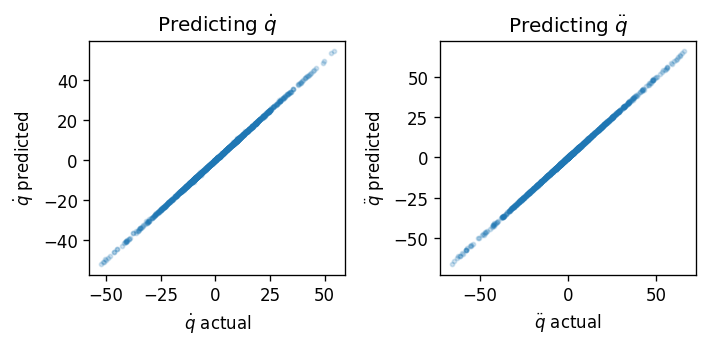

In [26]:
xt_pred = jax.vmap(partial(equation_of_motion, learned_lagrangian(params)))(x_test)

fig, axes = plt.subplots(1, 2, figsize=(6, 3), dpi=120)
axes[0].scatter(xt_test[:, 2], xt_pred[:, 2], s=6, alpha=0.2)
axes[0].set_title(r'Predicting $\dot q$')
axes[0].set_xlabel(r'$\dot q$ actual')
axes[0].set_ylabel(r'$\dot q$ predicted')
axes[1].scatter(xt_test[:, 3], xt_pred[:, 3], s=6, alpha=0.2)
axes[1].set_title(r'Predicting $\ddot q$')
axes[1].set_xlabel(r'$\ddot q$ actual')
axes[1].set_ylabel(r'$\ddot q$ predicted')
plt.tight_layout()

## Evolution of full coordinate space

In [27]:
# make a meshgrid of possible angles
angle_range = -np.pi + 2 * np.pi * np.arange(100)/100
x_scanned = np.stack(np.meshgrid(angle_range, angle_range, [0.0], [0.0], indexing='ij'), axis=-1).reshape(-1, 4)
xt_actual = jax.vmap(f_analytical)(x_scanned) # actual time derivatives
xt_predicted = jax.vmap(partial(equation_of_motion, learned_lagrangian(params)))(x_scanned)

Prediction of \dot theta1


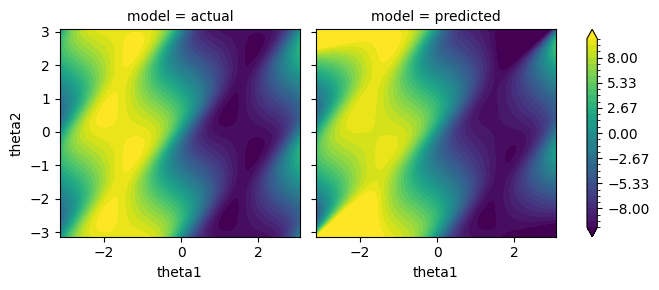

Prediction of  \dot theta2


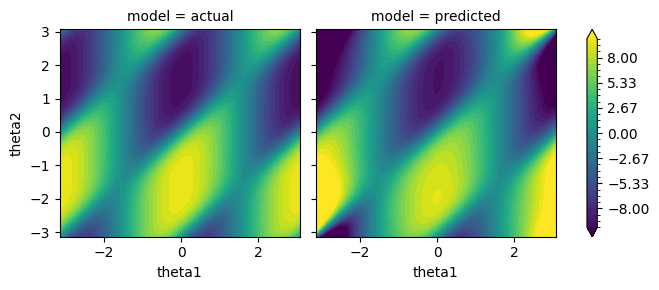

In [28]:
dataarray = xarray.DataArray(np.stack([xt_actual.reshape(100, 100, 4),
                                       xt_predicted.reshape(100, 100, 4)]),
                             dims=['model', 'theta1', 'theta2', 'time_derivative'],
                             coords={'model': ['actual', 'predicted'], 'theta1': angle_range, 'theta2': angle_range})
dataarray.isel(time_derivative=2).plot.contourf(levels=31, col='model', x='theta1', y='theta2', vmin=-10, vmax=10)
print(r"Prediction of \dot theta1")
plt.show()
dataarray.isel(time_derivative=3).plot.contourf(levels=31, col='model', x='theta1', y='theta2', vmin=-10, vmax=10)
print(r"Prediction of  \dot theta2")
plt.show()

## Predicting the dynamics


We can now evaluate the model prediction by visualising the time evolution of the system from an arbitary starting point

In [39]:
# choose an initial state
x1 = np.array([3*np.pi/4, 3*np.pi/7, 0, 0], dtype=np.float32)

t2 = np.linspace(0, 20, num=301)
x1_analytical = jax.device_get(solve_analytical(x1, t2)) #analytical solution
noise_coeff_3 = 1e-3
x1_perturbed = jax.device_get(solve_analytical(x1 + noise_coeff_3 * noise, t2))
x1_model = jax.device_get(solve_lagrangian(learned_lagrangian(params), x1, t=t2)) #model prediction

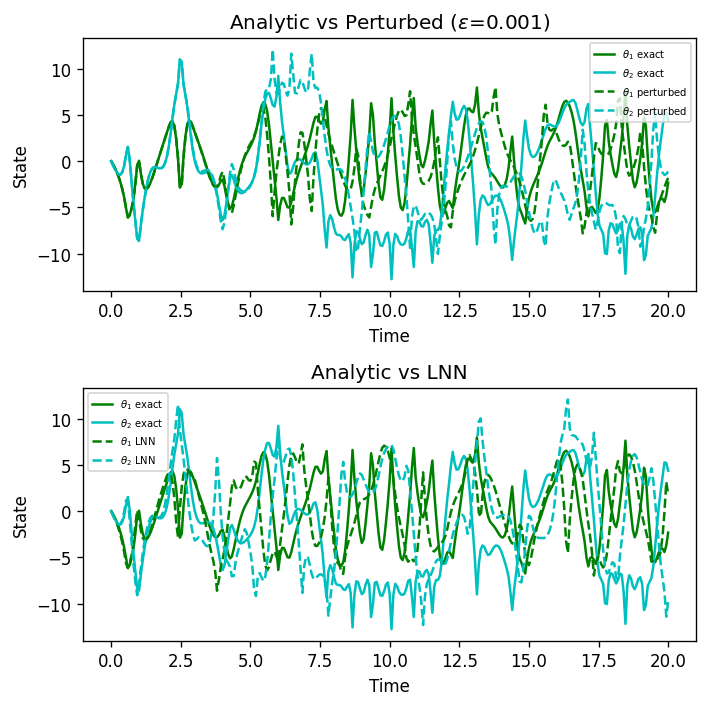

In [40]:
plt.figure(figsize=[6,6], dpi=120)
plt.subplot(2,1,1)
plt.title(r"Analytic vs Perturbed ($\epsilon$={})".format(noise_coeff_3))
plt.xlabel("Time") ; plt.ylabel("State")
plt.plot(t2, x1_analytical[:, 2], 'g-', label=r'$\theta_1$ exact')
plt.plot(t2, x1_analytical[:, 3], 'c-', label=r'$\theta_2$ exact')
plt.plot(t2, x1_perturbed[:, 2], 'g--', label=r'$\theta_1$ perturbed')
plt.plot(t2, x1_perturbed[:, 3], 'c--', label=r'$\theta_2$ perturbed')
plt.legend(fontsize=6)

plt.subplot(2,1,2)
plt.title("Analytic vs LNN")
plt.xlabel("Time") ; plt.ylabel("State")
plt.plot(t2, x1_analytical[:, 2], 'g-', label=r'$\theta_1$ exact')
plt.plot(t2, x1_analytical[:, 3], 'c-', label=r'$\theta_2$ exact')
plt.plot(t2, x1_model[:, 2], 'g--', label=r'$\theta_1$ LNN')
plt.plot(t2, x1_model[:, 3], 'c--', label=r'$\theta_2$ LNN')
plt.legend(fontsize=6)

plt.tight_layout()
plt.show()

Double pendulum is just a couple of sticks.. almost. so we can actually see the dynamics instead of inferring from the plots

In [41]:
import cv2
import matplotlib.animation as animation
from IPython.display import HTML
def make_plot(i, cart_coords, l1, l2, max_trail=30, trail_segments=20, r = 0.05):
    # Plot and save an image of the double pendulum configuration for time step i.
    plt.cla()

    x1, y1, x2, y2 = cart_coords
    ax.plot([0, x1[i], x2[i]], [0, y1[i], y2[i]], lw=2, c='k') # rods
    c0 = Circle((0, 0), r/2, fc='k', zorder=10) # anchor point
    c1 = Circle((x1[i], y1[i]), r, fc='b', ec='b', zorder=10) # mass 1
    c2 = Circle((x2[i], y2[i]), r, fc='r', ec='r', zorder=10) # mass 2
    ax.add_patch(c0)
    ax.add_patch(c1)
    ax.add_patch(c2)

    # plot the pendulum trail (ns = number of segments)
    s = max_trail // trail_segments
    for j in range(trail_segments):
        imin = i - (trail_segments-j)*s
        if imin < 0: continue
        imax = imin + s + 1
        alpha = (j/trail_segments)**2 # fade the trail into alpha
        ax.plot(x2[imin:imax], y2[imin:imax], c='r', solid_capstyle='butt',
                lw=2, alpha=alpha)

    # Center the image on the fixed anchor point. Make axes equal.
    ax.set_xlim(-l1-l2-r, l1+l2+r)
    ax.set_ylim(-l1-l2-r, l1+l2+r)
    ax.set_aspect('equal', adjustable='box')
    plt.axis('off')

def radial2cartesian(t1, t2, l1, l2):
  # Convert from radial to Cartesian coordinates.
  x1 = l1 * np.sin(t1)
  y1 = -l1 * np.cos(t1)
  x2 = x1 + l2 * np.sin(t2)
  y2 = y1 - l2 * np.cos(t2)
  return x1, y1, x2, y2


def fig2image(fig):
  fig.canvas.draw()
  # data = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
  # image = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
  img = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
  img = img.reshape(fig.canvas.get_width_height()[::-1] + (4,))  # RGBA has 4 channels
  img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)
  #image = np.asarray(fig.canvas.buffer_rgba())
  return img

# Function to update the frame in the animation
def animate(i):
    im.set_data(images[i])
    return [im]


Using analytical solutions


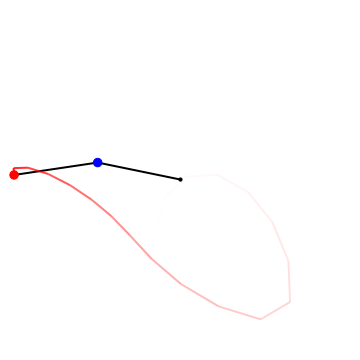

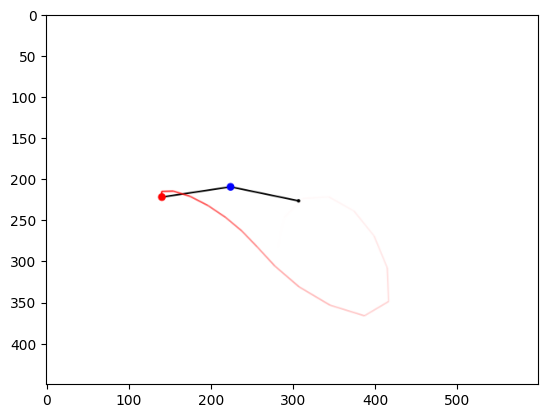

In [42]:
# Analytical Dynamics
print('Using analytical solutions')
L1, L2 = 1, 1
theta1, theta2 = x1_analytical[:, 0], x1_analytical[:, 1]
cart_coords = radial2cartesian(theta1, theta2, L1, L2)

fig = plt.figure(figsize=(8.3333, 6.25), dpi=72)
ax = fig.add_subplot(111)


images = []
di = 1
N = 300
for i in range(0, N, di):
  make_plot(i, cart_coords, L1, L2)
  images.append(fig2image(fig))


# Create the figure and initial image
fig, ax = plt.subplots()
im = ax.imshow(images[0])  # Display the first image

# Create the animation
anim = animation.FuncAnimation(fig, animate, frames=300, interval=50, blit=True, repeat=False) # Adjust interval for speed

# Convert the animation to HTML5 video and display in Colab
HTML(anim.to_jshtml())

Using model predictions


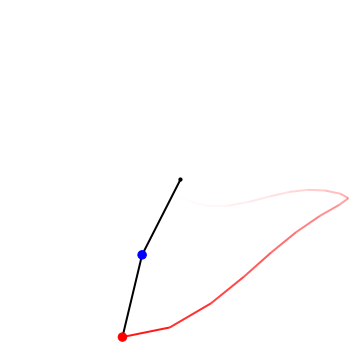

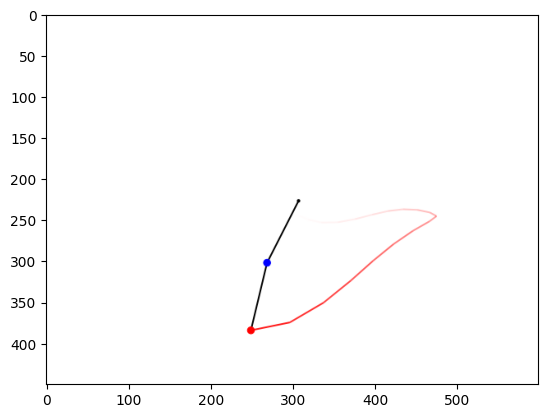

In [43]:
#Model Dynamics
print('Using model predictions')

L1, L2 = 1, 1
theta1, theta2 = x1_model[:, 0], x1_model[:, 1]
cart_coords = radial2cartesian(theta1, theta2, L1, L2)

fig = plt.figure(figsize=(8.3333, 6.25), dpi=72)
ax = fig.add_subplot(111)

images = []
di = 1
N = 300
for i in range(0, N, di):
  make_plot(i, cart_coords, L1, L2)
  images.append( fig2image(fig) )


# Create the figure and initial image
fig, ax = plt.subplots()
im = ax.imshow(images[0])

anim = animation.FuncAnimation(fig, animate, frames=300, interval=50, blit=True, repeat=False)
# Convert the animation to HTML5 video and display
HTML(anim.to_jshtml())